# Splitting the data into time-periods

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
import json
%matplotlib inline
plt.style.use('ggplot')
import warnings
warnings.filterwarnings("ignore")

master = pd.read_csv('../final_data_set.csv', sep = ';', encoding = 'utf-8')

master = master.query('laureate_name!="vanvleck, jh"').copy() # Han er der 2 gange 

In [33]:
''' Plot the top X out- and in- degree nodes '''
def plot_top_nodes(G=None, top_n = 50, hue_name = None ,hue_dict = None, w = False, title = ''):
    
    if w:
        _df = pd.DataFrame(sorted(dict(G.degree(weight="weight")).items(), key = lambda x: x[1], reverse = True)[:top_n],
                   columns = ['Name','count'])


    else: 
        _df = pd.DataFrame(sorted(dict(G.degree()).items(), key = lambda x: x[1], reverse = True)[:top_n],
                       columns = ['Name','count'])

    _df[hue_name] = _df.Name.apply(lambda x: hue_dict[x])
    
    fig, ax = plt.subplots(figsize = (12,6))
    sns.scatterplot(data = _df, x='Name', y='count', hue = hue_name, palette = "deep",ax=ax)
    ax.set_ylabel('Degree', size = 15)
    ax.set_xlabel(None)
    plt.xticks(rotation=90, size = 12)
    ax.set_title(f'Degree distribution for top {top_n} node - {title}', size = 15)
    return fig


''' Recolor nodes based on a partition dictionary and colormap 
    Only works if all nodes in nx_configs are in partition_dict as well '''

def redefine_attr(nx_configs, partition_dict, _sort = False , _cmap = plt.cm.Spectral_r):
    import copy
    import matplotlib
    import random
    ''' Using The sort parameter, you can reference at dict to sort the attributes by,
    where the dicts keys is the attribute, and the dicts value represents some order '''
    
    if _sort:
        _keys = sorted(set(partition_dict.values()), key = lambda x: _sort[x], reverse = True)
    else:
        _keys = list(set(partition_dict.values())) # the attribute classes
        random.shuffle(_keys) # shuffle order - 
        
    n_keys = len(_keys) # how many are there? how many colors do we need?
    # assign each attribute class a unique value between 0 and 1
    # _num/(n_keys-1) --> standarize score with 0 and 1 as min and max
    attr_scale_dict = {_cat:_num/(n_keys-1) for _cat, _num in zip(_keys, range(n_keys))}

    # Copy dict - deep copy as the values are nested in a list
    new_nw = copy.deepcopy(nx_configs)
    
    for node_nr in range(len(nx_configs['nodes'])):
        node = nx_configs['nodes'][node_nr]['id'] # node id 
        attr = partition_dict[node] # get the attribute class of the node
        num_attr = attr_scale_dict[attr] # get the numerical 
        _cmap_color = _cmap(num_attr)
        # overwrite node color based on new attr
        new_nw['nodes'][node_nr]['color'] = matplotlib.colors.rgb2hex(_cmap_color) 
        
    return new_nw

In [72]:
import networkx as nx
from networkx.algorithms import bipartite
import pandas as pd
G_bi = nx.Graph()
G_bi.add_nodes_from(master["laureate_name"], bipartite = 0)
G_bi.add_nodes_from(master["affiliation"], bipartite = 1)
edge_list = list(master[["laureate_name", "affiliation"]].to_records(index=False))
G_bi.add_edges_from(edge_list)

node_attr = {n:d["bipartite"] for n, d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name = 'group')

''' make weights '''
edge_w_dict = {tuple(key):0 for key in edge_list}
for key in edge_list:
    edge_w_dict[tuple(key)] += 1
    
# We Set weights 
nx.set_edge_attributes(G_bi, edge_w_dict, name = "weight")

In [ ]:
''' Only if the configs seem off '''
#Use netwulf to visualize
# network, config = nw.visualize(G_bi, plot_in_cell_below=False)

In [8]:
''' Save configs if necesarry '''
# with open('nx_configs/overall_bipartite.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

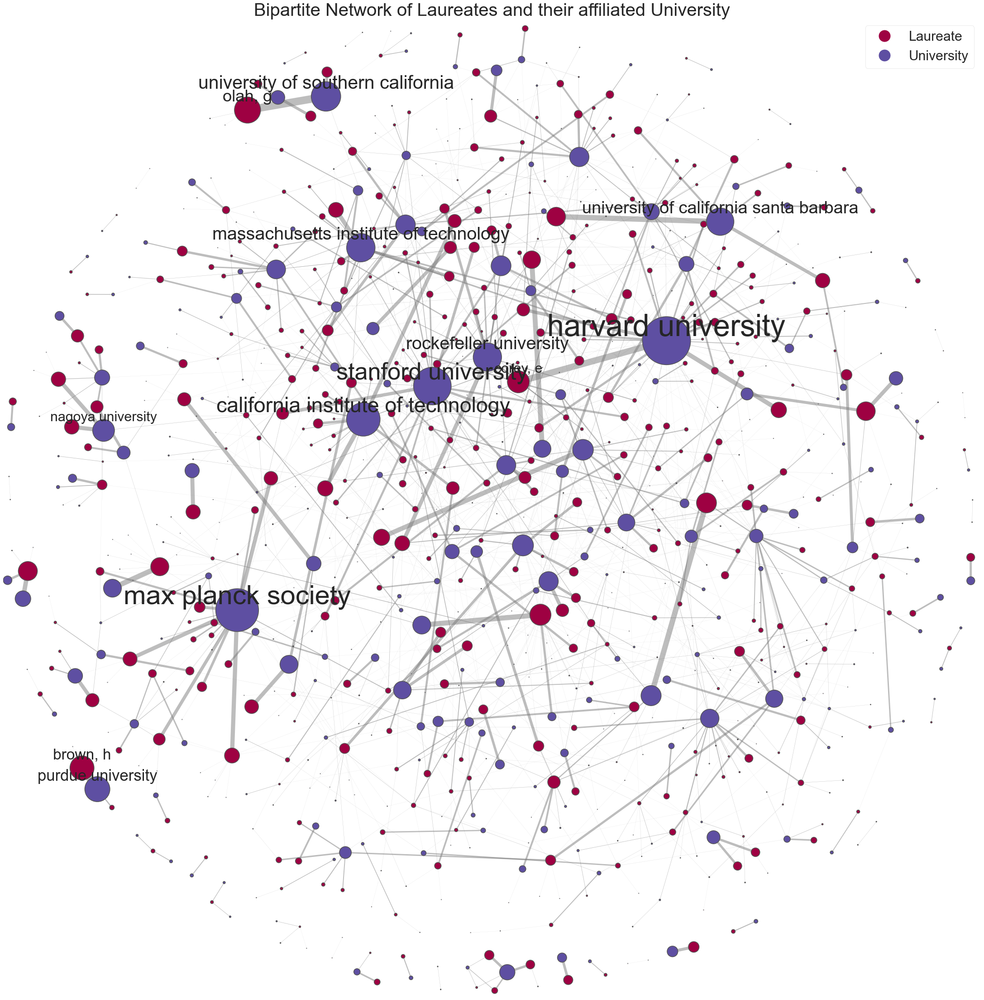

In [73]:
import netwulf as nw
plt.style.use('seaborn-white')

with open('nx_configs/overall_bipartite.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bi, plot_in_cell_below=False, config = config)

# set colormap of the plot 
network = redefine_attr(network, node_attr)

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network)

# Dict to assign labels to the plot 
laureate_dict = dict.fromkeys(master["laureate_name"], "Laureate")
university_dict = dict.fromkeys(master["affiliation"], "University")
laureate_dict.update(university_dict)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>10: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*3)
    else:
        pass

val_map = {laureate_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 25)

frame=plt.legend(fontsize = 30, frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

plt.title('Bipartite Network of Laureates and their affiliated University', size = 40)

# Saving as pdf
plt.savefig('Plots/bipartite_laureate_uni.', dpi=None, facecolor='w', edgecolor='w', bbox_inches='tight')

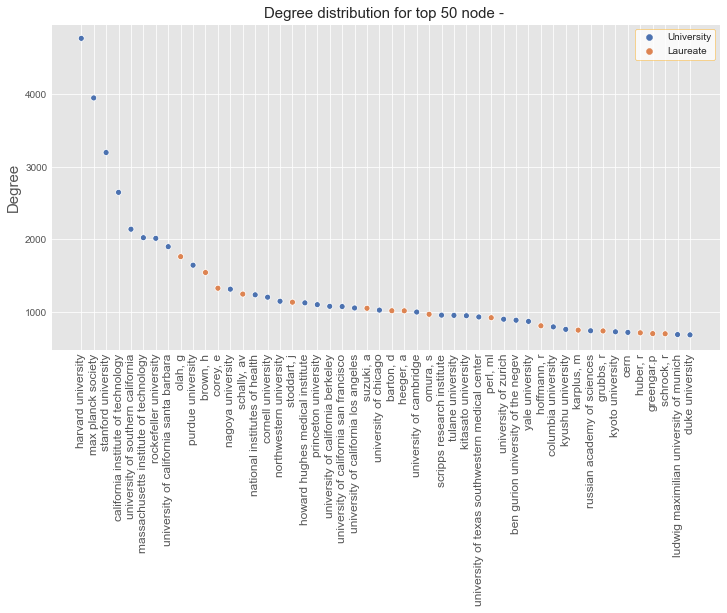

In [41]:
plt.style.use('ggplot')
f = plot_top_nodes(G=G_bi,
                   w = True,
                   hue_name = '',
                   hue_dict = laureate_dict)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
f.savefig('Plots/top_connected.', dpi=None, facecolor='w', edgecolor='w', bbox_inches="tight")

In [42]:
## Split into projections 
top_nodes = {n for n, d in G_bi.nodes(data=True) if d["bipartite"] == 0} # Laureates 
bottom_nodes = set(G_bi) - top_nodes

## Projections 
G_top_pro = bipartite.projection.weighted_projected_graph(G_bi, top_nodes)
G_bottom_pro = bipartite.projection.weighted_projected_graph(G_bi, bottom_nodes)

''' Nationality hue for laureates '''
master.nationality = master.nationality.apply(lambda x: x.split(',')[0])
master.nationality = master.nationality.apply(lambda x: x.split('-')[0])
name_nat_dict = {name:nat for name, nat in zip(master.laureate_name, master.nationality)}

# Assign communty labels
nx.set_node_attributes(G_top_pro, name_nat_dict, 'group')

In [43]:
''' Only if the configs seem off '''
#Use netwulf to visualize
# network, config = nw.visualize(G_top_pro, plot_in_cell_below=False)

' Only if the configs seem off '

In [46]:
# ''' Save configs if necesarry '''
# with open('nx_configs/lau_bipartite.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

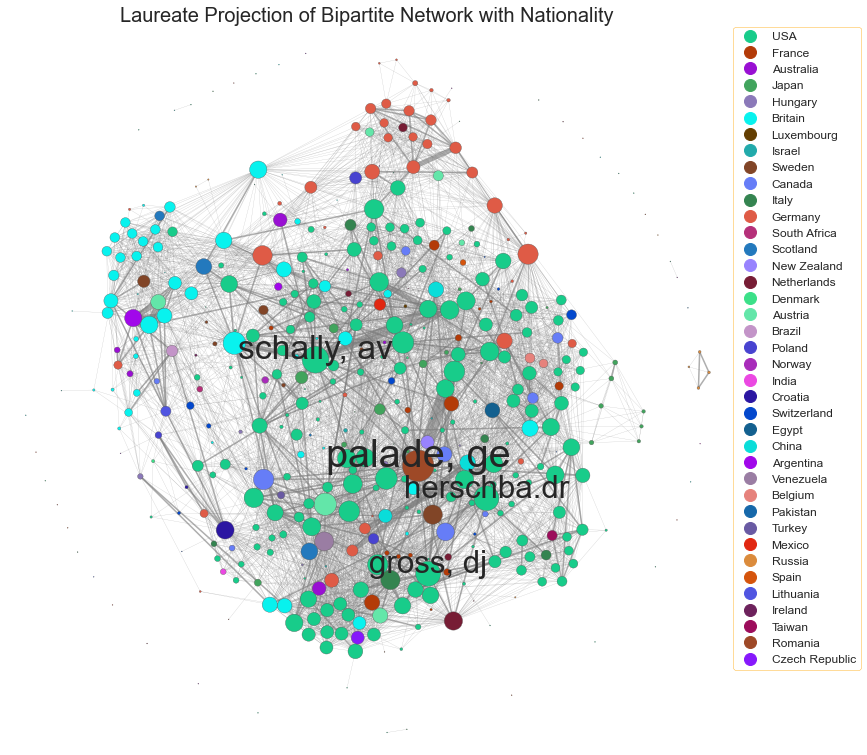

In [48]:
with open('nx_configs/lau_bipartite.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network, figsize = 10)
ax.set_title('Laureate Projection of Bipartite Network with Nationality', size = 20)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>15: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*2)
    else:
        pass


val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1,1.01), fontsize = 12, frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
plt.savefig('Plots/laureate_projection_nationality.png', dpi=200, bbox_inches='tight')

In [49]:
import netwulf as nw
nat_dict = {name:(nat if pd.isna(nat)==False else 'USA') \
            for name, nat in zip(master.affiliation, master.uni_nationality)}
# Assign communty labels
nx.set_node_attributes(G_bottom_pro, nat_dict, 'group')

In [ ]:
#Use netwulf to visualize
# network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False)

In [29]:
''' Save configs if necesarry '''
# with open('nx_configs/org_bipartite.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

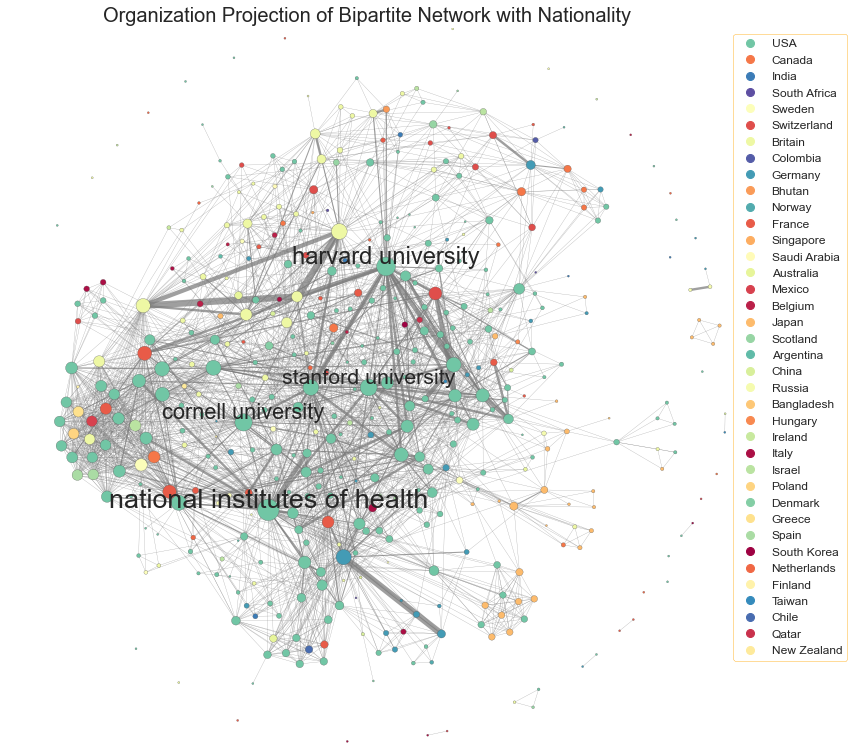

In [51]:
with open('nx_configs/org_bipartite.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False, config = config)

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

network = redefine_attr(network, nat_dict) # colormap it

fig, ax = nw.draw_netwulf(network, figsize = 10)
ax.set_title('Organization Projection of Bipartite Network with Nationality', size = 20)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>10: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*2)
    else:
        pass

val_map = {nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 8)
# Place legend
legend = plt.legend(bbox_to_anchor = (1,1.0), fontsize = 12, frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
fig.tight_layout()
plt.savefig('Plots/university_projection_nationality.png', dpi=200, bbox_inches='tight')

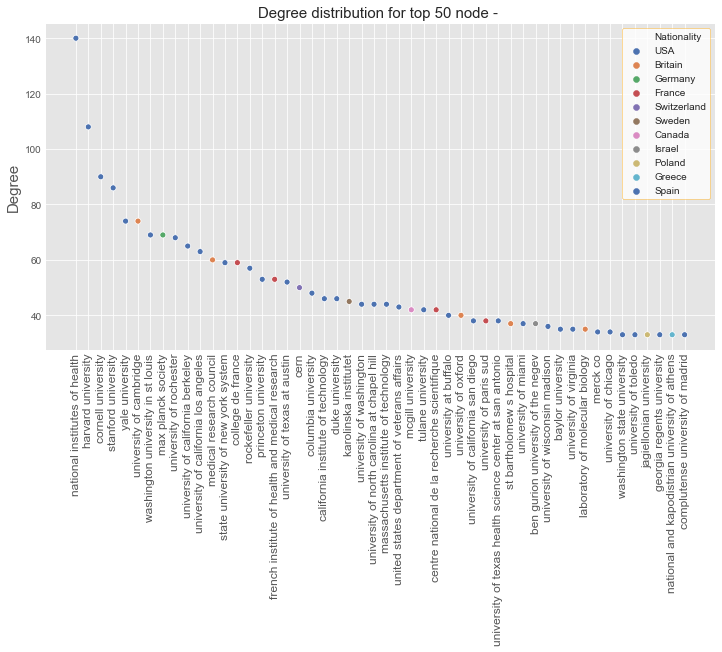

In [52]:
f = plot_top_nodes(G=G_bottom_pro,
                   hue_name = 'Nationality',
                   w = True,
                   hue_dict = nat_dict)

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
f.savefig('Plots/top_connected_university_bipart.png', dpi=None, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [55]:
master = master.dropna(subset=["laureate_name", "affiliation", 'uni_nationality']) # remove missing

''' Split into timeperiods - take the carreers of the nobel laurates of the 4 periods '''
first_period = master.query('prize_year <= 1939').copy()
second_period = master.query('prize_year >= 1940 and prize_year <= 1969').copy()
third_period = master.query('prize_year >= 1970 and prize_year <= 1999').copy()
fourth_period = master.query('prize_year >= 2000').copy()

''' How many years? '''
print('How many year')
print(len(first_period.drop_duplicates(["prize_year"])))
print(len(second_period.drop_duplicates(["prize_year"])))
print(len(third_period.drop_duplicates(["prize_year"])))
print(len(fourth_period.drop_duplicates(["prize_year"])))

''' How many people? '''
print('How many laureates')
print(len(first_period.drop_duplicates(["prize_year", 'laureate_name'])))
print(len(second_period.drop_duplicates(["prize_year", 'laureate_name'])))
print(len(third_period.drop_duplicates(["prize_year", 'laureate_name'])))
print(len(fourth_period.drop_duplicates(["prize_year", 'laureate_name'])))

How many year
22
27
30
17
How many laureates
44
108
181
118


# -1939

In [56]:
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
plt.style.use('ggplot')

''' Create network '''
G_bi = nx.Graph()
G_bi.add_nodes_from(first_period["laureate_name"], bipartite = 0)
G_bi.add_nodes_from(first_period["affiliation"], bipartite = 1)
edge_list = list(first_period[["laureate_name", "affiliation"]].to_records(index=False))
G_bi.add_edges_from(edge_list)

node_attr = {n:d["bipartite"] for n, d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name = 'group')

''' make weights '''
edge_w_dict = {tuple(key):0 for key in edge_list}
for key in edge_list:
    edge_w_dict[tuple(key)] += 1
    
# We Set weights 
nx.set_edge_attributes(G_bi, edge_w_dict, name = "weight")

In [48]:
''' Run if config needs chaning '''
# network, config = nw.visualize(G_bi, plot_in_cell_below=False) # Run netwulf

' Run if config needs chaning '

In [143]:
# with open('nx_configs/bipartite_1939.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

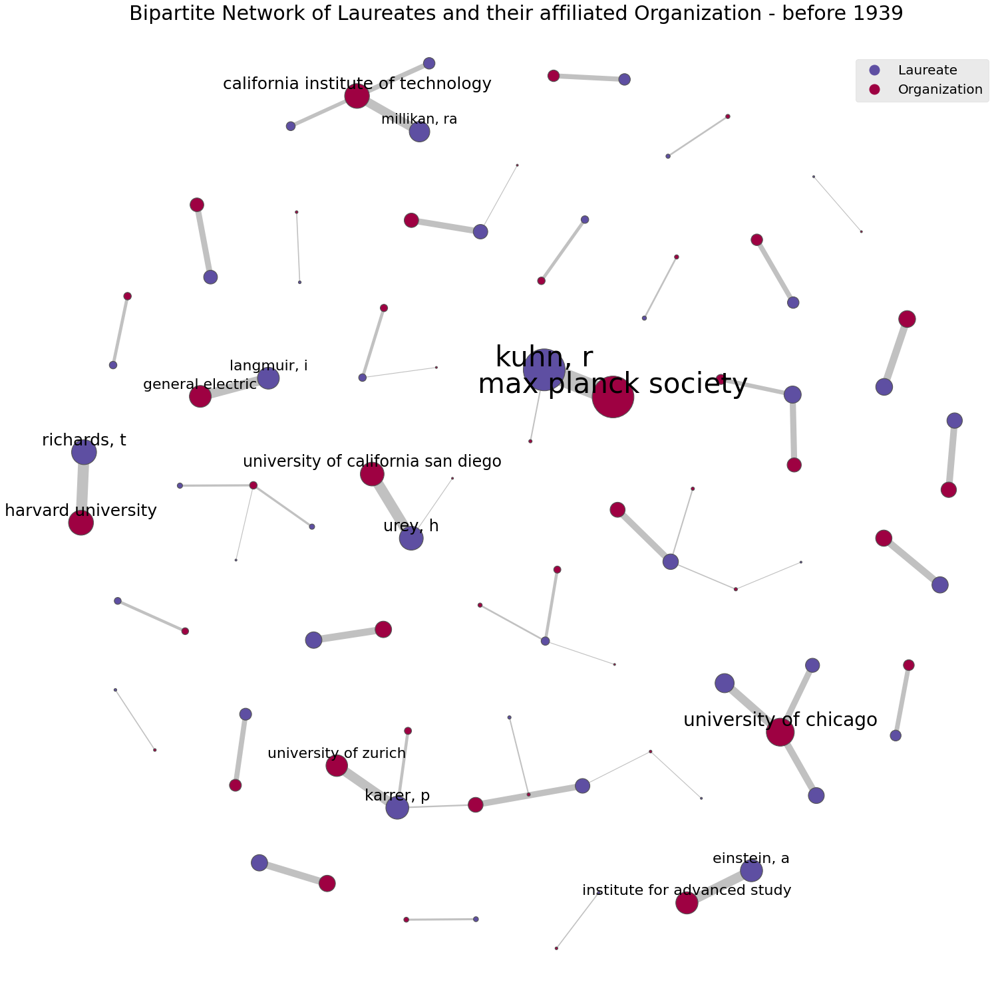

In [148]:
with open('nx_configs/bipartite_1939.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bi, plot_in_cell_below=False, config = config)

network = redefine_attr(network, node_attr) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (20,20)

# Drawing the network
fig, ax = nw.draw_netwulf(network)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>10: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*2)
    else:
        pass



''' attribute/hue dicts '''
laureate_dict = dict.fromkeys(first_period["laureate_name"], "Laureate")
university_dict = dict.fromkeys(first_period["affiliation"], "Organization")
laureate_dict.update(university_dict)


val_map = {laureate_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 15)

# Place legend
plt.legend(bbox_to_anchor = (1,0.97), fontsize = 20)
ax.set_title(f'Bipartite Network of Laureates and their affiliated Organization - before 1939', size = 30)

# Saving as pdf
plt.savefig(f'Plots/before 1939/bipartite_laureate_uni.', dpi=300, facecolor='w', edgecolor='w',
            bbox_inches="tight")

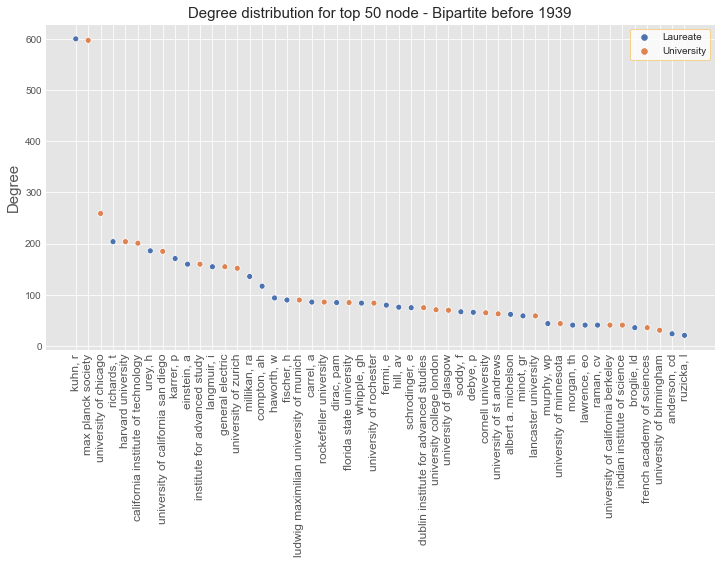

In [63]:
''' top nodes in bipartite network'''
f = plot_top_nodes(G=G_bi,
           hue_name = '',
           hue_dict = laureate_dict,
           w = True,
           title = f'Bipartite before 1939')

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/before 1939/top_connected.', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [58]:
#### Split into projections ####
top_nodes = {n for n, d in G_bi.nodes(data=True) if d["bipartite"] == 0} # Laureates 
bottom_nodes = set(G_bi) - top_nodes

## Projections 
G_top_pro = bipartite.projection.weighted_projected_graph(G_bi, top_nodes)
G_bottom_pro = bipartite.projection.weighted_projected_graph(G_bi, bottom_nodes)

''' Nationality hue for laureates '''
first_period.nationality = first_period.nationality.apply(lambda x: x.split(',')[0])
name_nat_dict = {name:nat for name, nat in zip(first_period.laureate_name, first_period.nationality)}

# Assign communty labels
nx.set_node_attributes(G_top_pro, name_nat_dict, 'group')

In [61]:
''' Run if configs needs changing '''
# #Use netwulf to visualize
# network, config = nw.visualize(G_top_pro, plot_in_cell_below=False)

' Run if configs needs changing '

In [152]:
''' Save if necesarry '''
# with open('nx_configs/lau_bipartite_1939.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

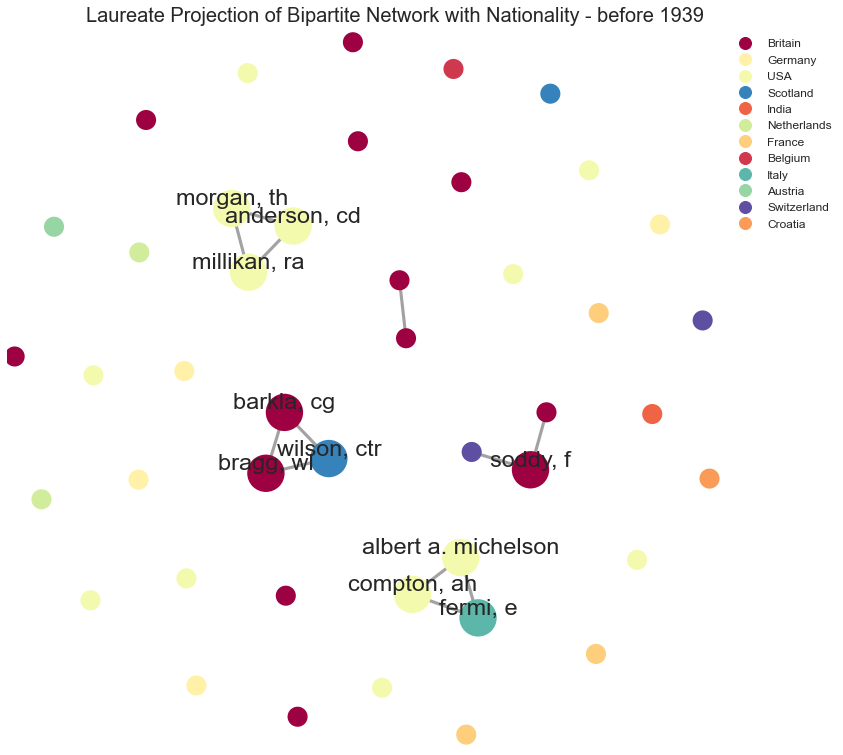

In [60]:
with open('nx_configs/lau_bipartite_1939.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, name_nat_dict) # colormap it

plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>20: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'          Laureate Projection of Bipartite Network with Nationality - before 1939', size = 20)

# Drawing a big figure


val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1.16,1.), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
plt.savefig(f'Plots/before 1939/laureate_projection_nationality.png', dpi=300, bbox_inches='tight')

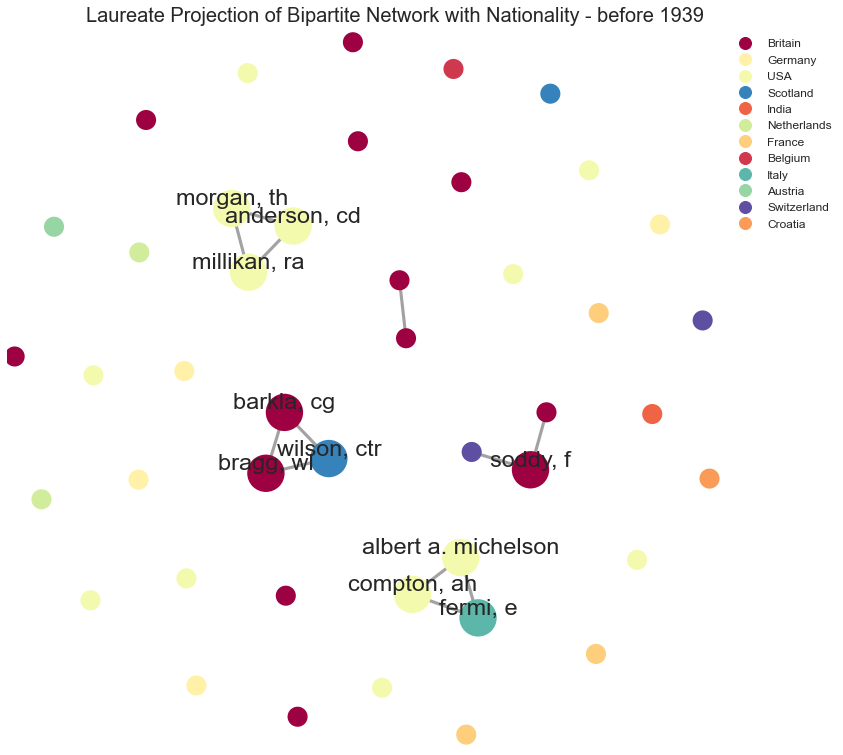

In [66]:
fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>20: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'          Laureate Projection of Bipartite Network with Nationality - before 1939', size = 20)

# Drawing a big figure


val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1.16,1.), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
plt.savefig(f'Plots/before 1939/laureate_projection_nationality.png', dpi=300, bbox_inches='tight')

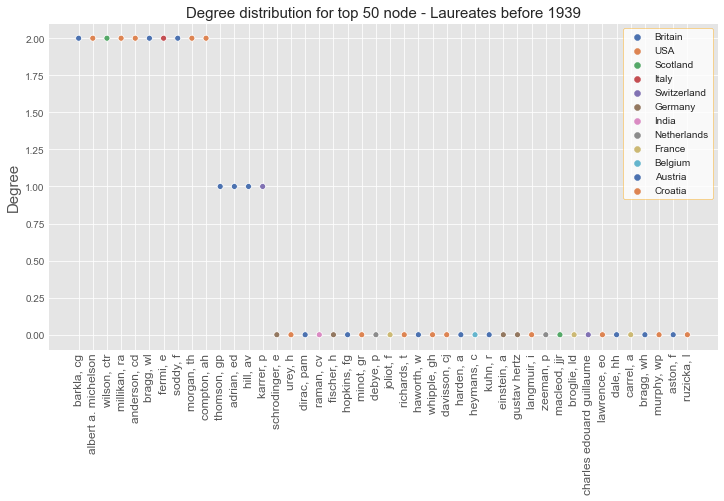

In [67]:
''' Top Laureate nodes with nationality as Hue '''
f = plot_top_nodes(G=G_top_pro,
               hue_name = '',
               hue_dict = name_nat_dict,
               w = True,
               title = f"Laureates before 1939")

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/before 1939/top_connected_laureate_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [68]:
''' Continent hue for organization ''' 
nat_dict = {name:(nat if pd.isna(nat)==False else 'USA') \
            for name, nat in zip(first_period.affiliation, first_period.uni_nationality)}

# Assign communty labels
nx.set_node_attributes(G_bottom_pro, nat_dict, 'group')

In [24]:
''' Run if configs needs changing'''
#Use netwulf to visualize
# network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False)

' Run if configs needs changing'

In [159]:
# ''' Save if necesarry '''
# with open('nx_configs/org_bipartite_1939.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

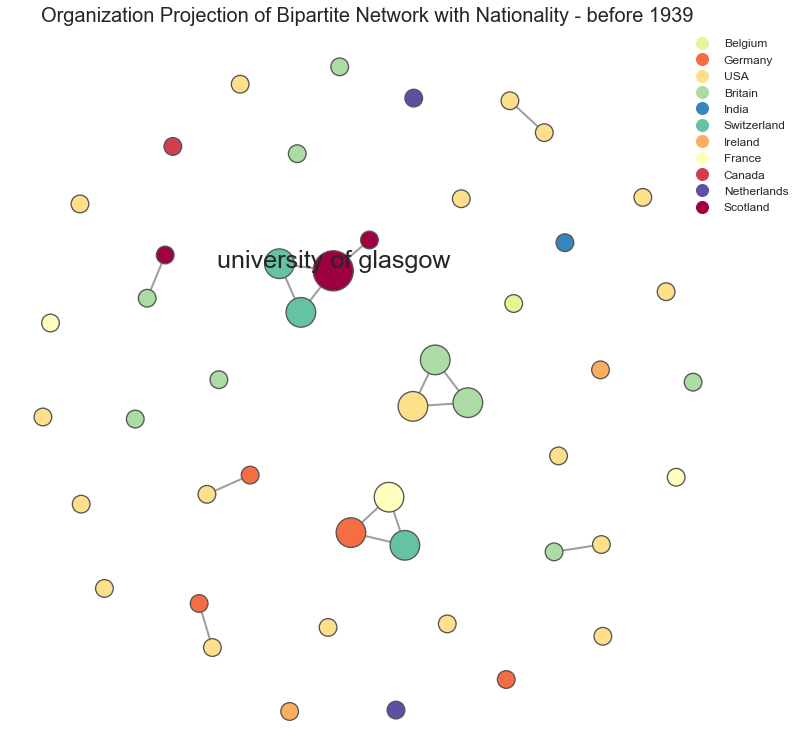

In [71]:
with open('nx_configs/org_bipartite_1939.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, nat_dict) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>20: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'Organization Projection of Bipartite Network with Nationality - before 1939', size = 20)


val_map = {nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)

# Place legend
legend = plt.legend(bbox_to_anchor = (1.1,1), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
plt.savefig(f'Plots/before 1939/university_projection_continent.png', dpi=300, bbox_inches='tight')

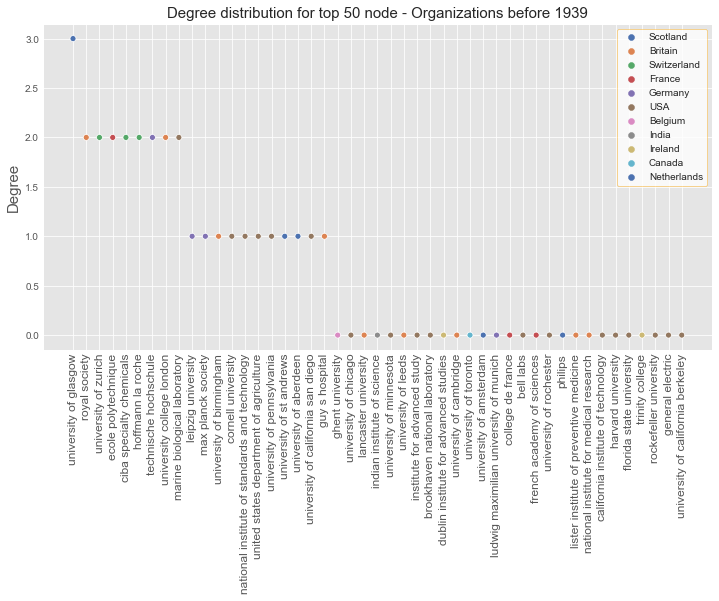

In [70]:
''' Top organization nodes with nationality as Hue '''
f = plot_top_nodes(G=G_bottom_pro,
               hue_name = '',
               hue_dict = nat_dict,
               w = True,
               title = f"Organizations before 1939")

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
f.savefig(f'Plots/before 1939/top_connected_university_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

# 1940-1969

In [63]:
_df = second_period
_period = "1940-1969"
_con_per = "1940_69"

In [64]:
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
plt.style.use('ggplot')

''' Create network '''
G_bi = nx.Graph()
G_bi.add_nodes_from(_df["laureate_name"], bipartite = 0)
G_bi.add_nodes_from(_df["affiliation"], bipartite = 1)
edge_list = list(_df[["laureate_name", "affiliation"]].to_records(index=False))
G_bi.add_edges_from(edge_list)

node_attr = {n:d["bipartite"] for n, d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name = 'group')

''' make weights '''
edge_w_dict = {tuple(key):0 for key in edge_list}
for key in edge_list:
    edge_w_dict[tuple(key)] += 1
    
# We Set weights 
nx.set_edge_attributes(G_bi, edge_w_dict, name = "weight")

In [30]:
''' Run if config needs chaning '''
# network, config = nw.visualize(G_bi, plot_in_cell_below=False) # Run netwulf

' Run if config needs chaning '

In [38]:
''' If new configs should be saved'''
# with open(f'nx_configs/bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

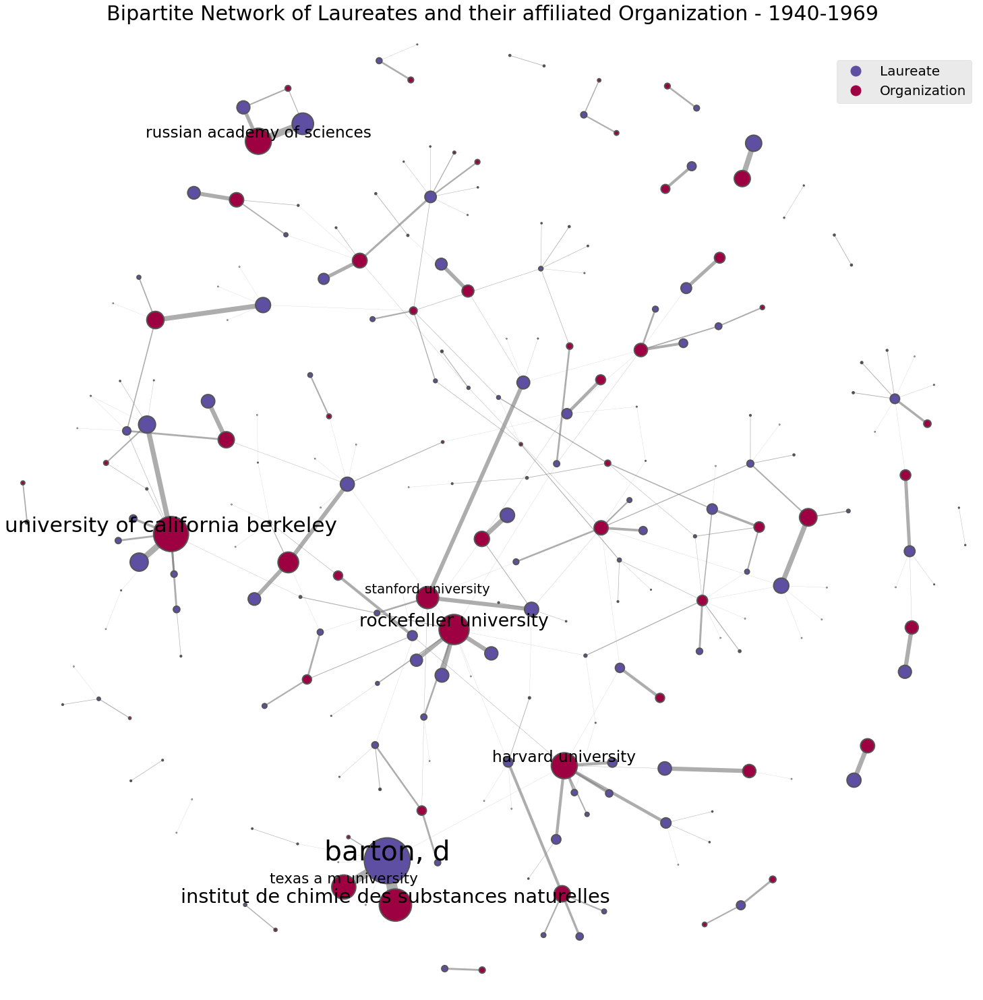

In [66]:
with open(f'nx_configs/bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bi, plot_in_cell_below=False, config = config)

network = redefine_attr(network, node_attr) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (20,20)

# Drawing the network
fig, ax = nw.draw_netwulf(network)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>16: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*1.2)
    else:
        pass



''' attribute/hue dicts '''
laureate_dict = dict.fromkeys(_df["laureate_name"], "Laureate")
university_dict = dict.fromkeys(_df["affiliation"], "Organization")
laureate_dict.update(university_dict)


val_map = {laureate_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 15)

# Place legend
plt.legend(bbox_to_anchor = (1,0.97), fontsize = 20)
ax.set_title(f'Bipartite Network of Laureates and their affiliated Organization - {_period}', size = 30)

# Saving as pdf
plt.savefig(f'Plots/{_period}/bipartite_laureate_uni.', dpi=300, facecolor='w', edgecolor='w',
            bbox_inches="tight")

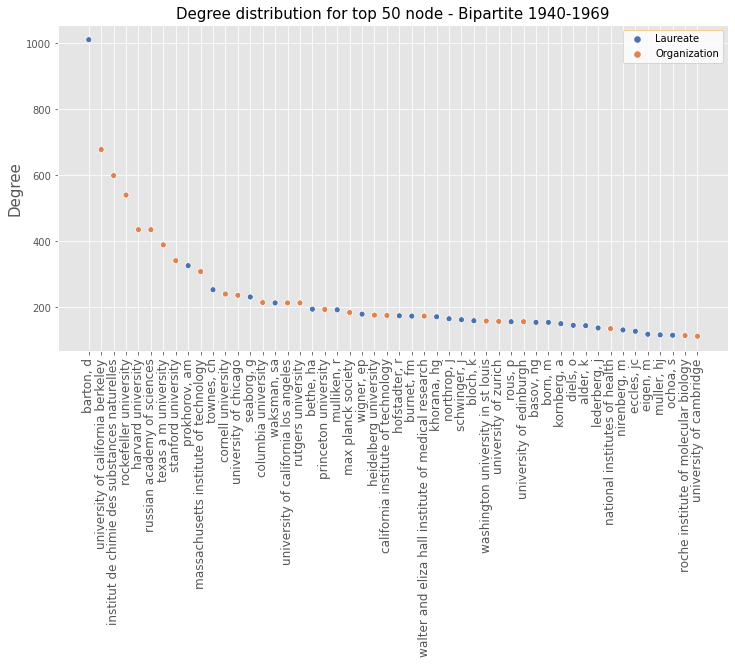

In [67]:
''' top nodes in bipartite network'''
f = plot_top_nodes(G=G_bi,
           hue_name = '',
           hue_dict = laureate_dict,
           w = True,
           title = f'Bipartite {_period}')

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected.', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [68]:
#### Split into projections ####
top_nodes = {n for n, d in G_bi.nodes(data=True) if d["bipartite"] == 0} # Laureates 
bottom_nodes = set(G_bi) - top_nodes

## Projections 
G_top_pro = bipartite.projection.weighted_projected_graph(G_bi, top_nodes)
G_bottom_pro = bipartite.projection.weighted_projected_graph(G_bi, bottom_nodes)

''' Nationality hue for laureates '''
_df.nationality = _df.nationality.apply(lambda x: x.split(',')[0])
name_nat_dict = {name:nat for name, nat in zip(_df.laureate_name, _df.nationality)}

# Assign communty labels
nx.set_node_attributes(G_top_pro, name_nat_dict, 'group')

In [35]:
''' Run if configs needs changing '''
# #Use netwulf to visualize
# network, config = nw.visualize(G_top_pro, plot_in_cell_below=False)

' Run if configs needs changing '

In [23]:
# ''' Save if necesarry '''
# with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

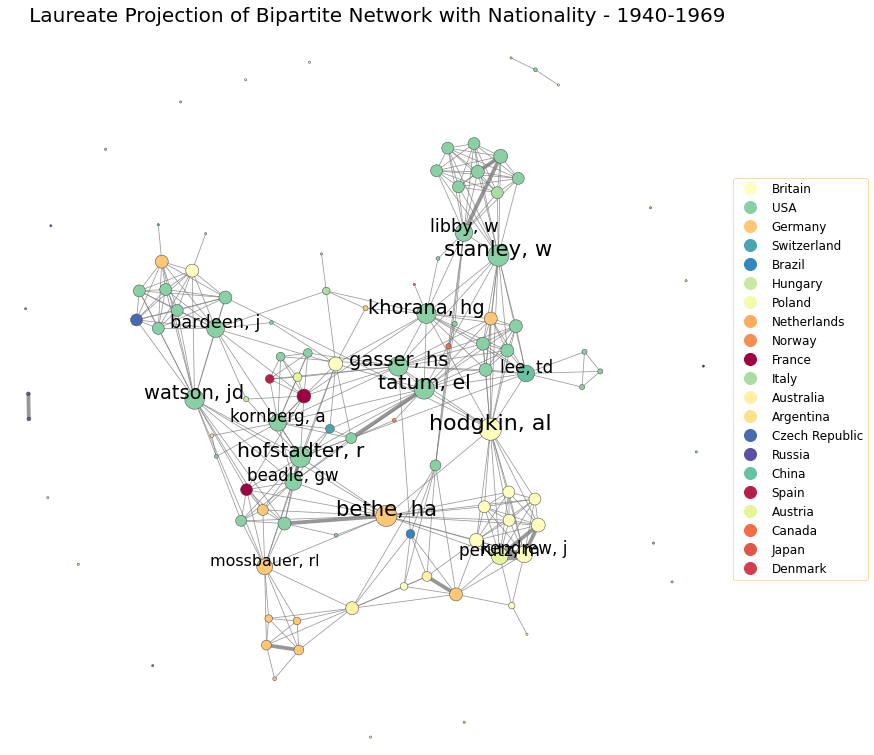

In [69]:
with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, name_nat_dict) # colormap it


# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>15: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'   Laureate Projection of Bipartite Network with Nationality - {_period}', size = 20)

val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.8), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')


# Saving as pdf
plt.savefig(f'Plots/{_period}/laureate_projection_nationality.png', dpi=300, bbox_inches='tight')

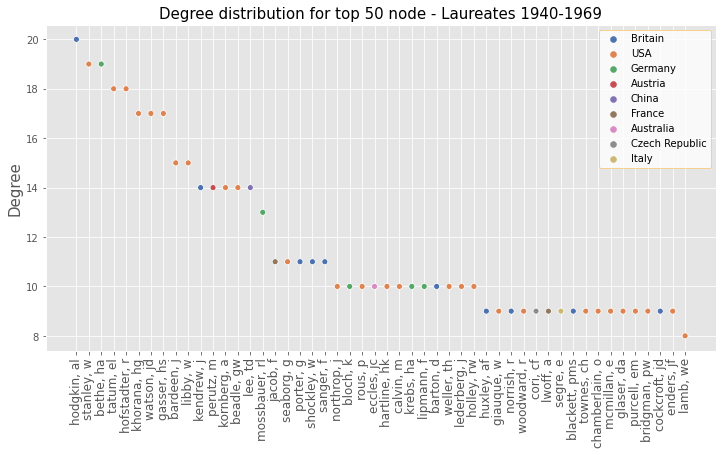

In [70]:
''' Top Laureate nodes with nationality as Hue '''
f = plot_top_nodes(G=G_top_pro,
               hue_name = '',
               hue_dict = name_nat_dict,
               w = True,
               title = f"Laureates {_period}")

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected_laureate_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [71]:
''' Continent hue for organization ''' 
nat_dict = {name:(nat if pd.isna(nat)==False else 'USA') \
            for name, nat in zip(_df.affiliation, _df.uni_nationality)}

# Assign communty labels
nx.set_node_attributes(G_bottom_pro, nat_dict, 'group')

In [72]:
''' Run if configs needs changing'''
#Use netwulf to visualize
# network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False)

' Run if configs needs changing'

In [73]:
# ''' Save if necesarry '''
# with open(f'nx_configs/org_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

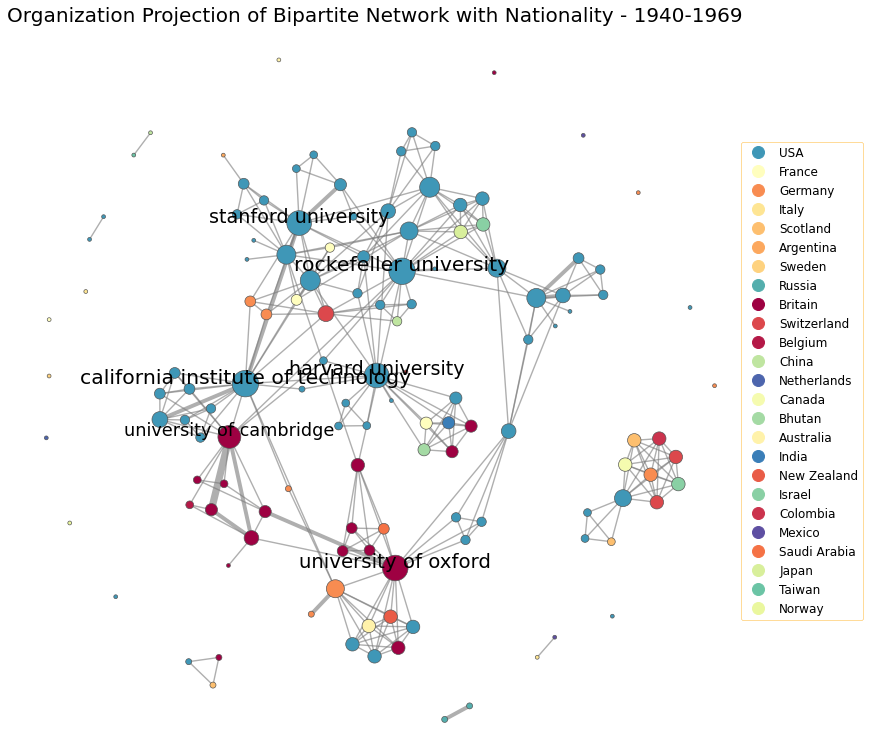

In [74]:
with open(f'nx_configs/org_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False, config = config)
network = redefine_attr(network, nat_dict) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>22: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']/1.3)
    else:
        pass


    
ax.set_title(f'Organization Projection of Bipartite Network with Nationality - {_period}', size = 20)


val_map = {nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)

# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.85), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
fig.tight_layout()
plt.savefig(f'Plots/{_period}/university_projection_continent.png', dpi=300, bbox_inches='tight')

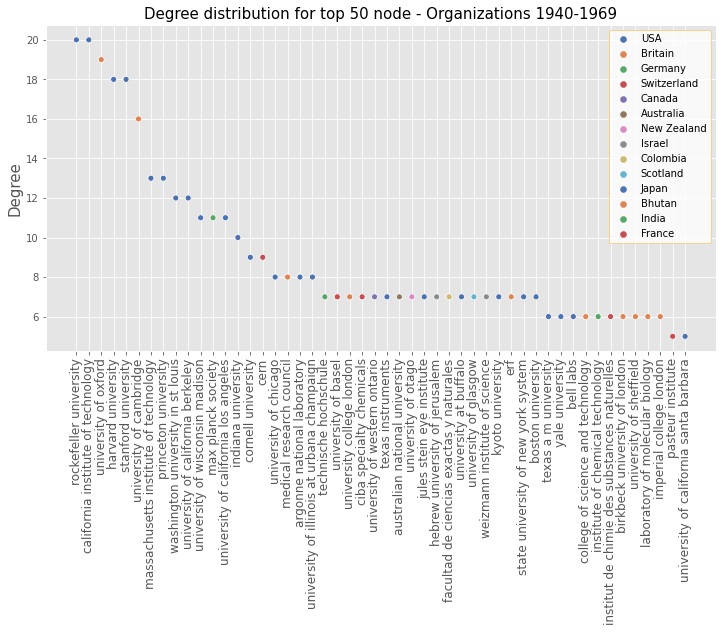

In [75]:
''' Top organization nodes with nationality as Hue '''
f = plot_top_nodes(G=G_bottom_pro,
               hue_name = '',
               hue_dict = nat_dict,
               w = True,
               title = f"Organizations {_period}")
# Place legend
legend = plt.legend(frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')
# Saving as pdf
f.savefig(f'Plots/{_period}/top_connected_university_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

# 1970-1999

In [133]:
_df = third_period
_period = "1970-1999"
_con_per = "1970_99"

In [134]:
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
plt.style.use('ggplot')

''' Create network '''
G_bi = nx.Graph()
G_bi.add_nodes_from(_df["laureate_name"], bipartite = 0)
G_bi.add_nodes_from(_df["affiliation"], bipartite = 1)
edge_list = list(_df[["laureate_name", "affiliation"]].to_records(index=False))
G_bi.add_edges_from(edge_list)

node_attr = {n:d["bipartite"] for n, d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name = 'group')

''' make weights '''
edge_w_dict = {tuple(key):0 for key in edge_list}
for key in edge_list:
    edge_w_dict[tuple(key)] += 1
    
# We Set weights 
nx.set_edge_attributes(G_bi, edge_w_dict, name = "weight")

In [50]:
''' Run if config needs chaning '''
# network, config = nw.visualize(G_bi, plot_in_cell_below=False) # Run netwulf

' Run if config needs chaning '

In [136]:
''' If new configs should be saved'''
# with open(f'nx_configs/bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

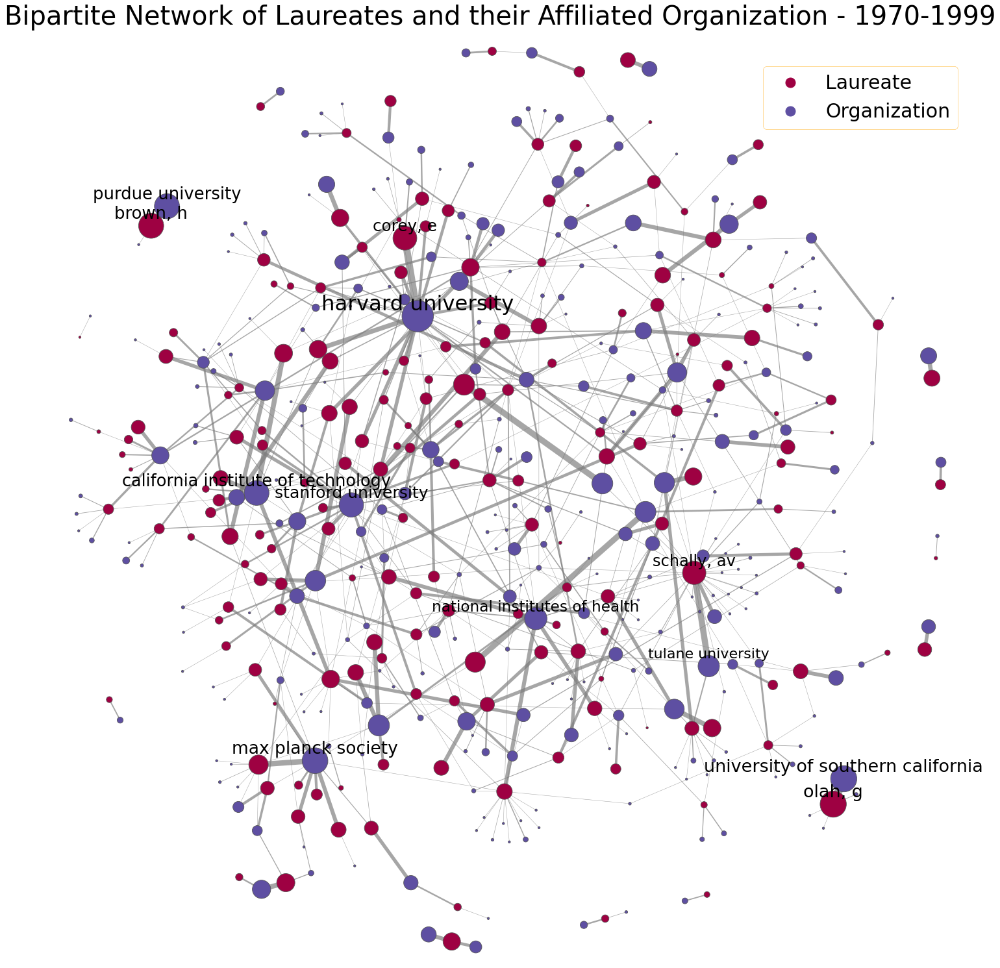

In [140]:
with open(f'nx_configs/bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bi, plot_in_cell_below=False, config = config)

network = redefine_attr(network, node_attr) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (20,20)

# Drawing the network
fig, ax = nw.draw_netwulf(network)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>11: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*2)
    else:
        pass



''' attribute/hue dicts '''
laureate_dict = dict.fromkeys(_df["laureate_name"], "Laureate")
university_dict = dict.fromkeys(_df["affiliation"], "Organization")
laureate_dict.update(university_dict)


val_map = {laureate_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 15)

# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.97), fontsize = 30)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

ax.set_title(f'Bipartite Network of Laureates and their Affiliated Organization - {_period}', size = 40)

# Saving as pdf
plt.savefig(f'Plots/{_period}/bipartite_laureate_uni.', dpi=300, facecolor='w', edgecolor='w',
            bbox_inches="tight")

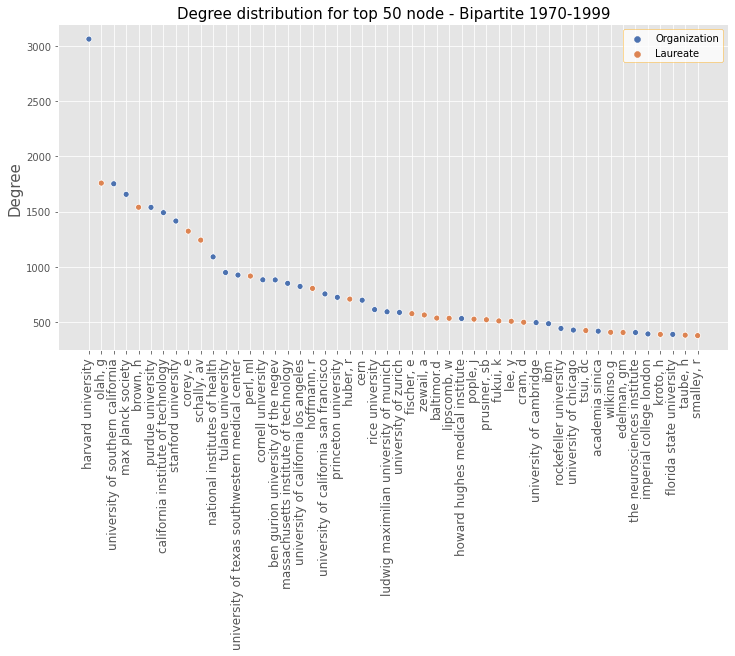

In [93]:
''' top nodes in bipartite network'''
f = plot_top_nodes(G=G_bi,
           hue_name = '',
           hue_dict = laureate_dict,
           w = True,
           title = f'Bipartite {_period}')

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected.', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [94]:
#### Split into projections ####
top_nodes = {n for n, d in G_bi.nodes(data=True) if d["bipartite"] == 0} # Laureates 
bottom_nodes = set(G_bi) - top_nodes

## Projections 
G_top_pro = bipartite.projection.weighted_projected_graph(G_bi, top_nodes)
G_bottom_pro = bipartite.projection.weighted_projected_graph(G_bi, bottom_nodes)

''' Nationality hue for laureates '''
_df.nationality = _df.nationality.apply(lambda x: x.split(',')[0])
name_nat_dict = {name:nat for name, nat in zip(_df.laureate_name, _df.nationality)}

# Assign communty labels
nx.set_node_attributes(G_top_pro, name_nat_dict, 'group')

In [57]:
''' Run if configs needs changing '''
# #Use netwulf to visualize
# network, config = nw.visualize(G_top_pro, plot_in_cell_below=False)

' Run if configs needs changing '

In [95]:
with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)


In [96]:
''' Save if necesarry '''
# with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

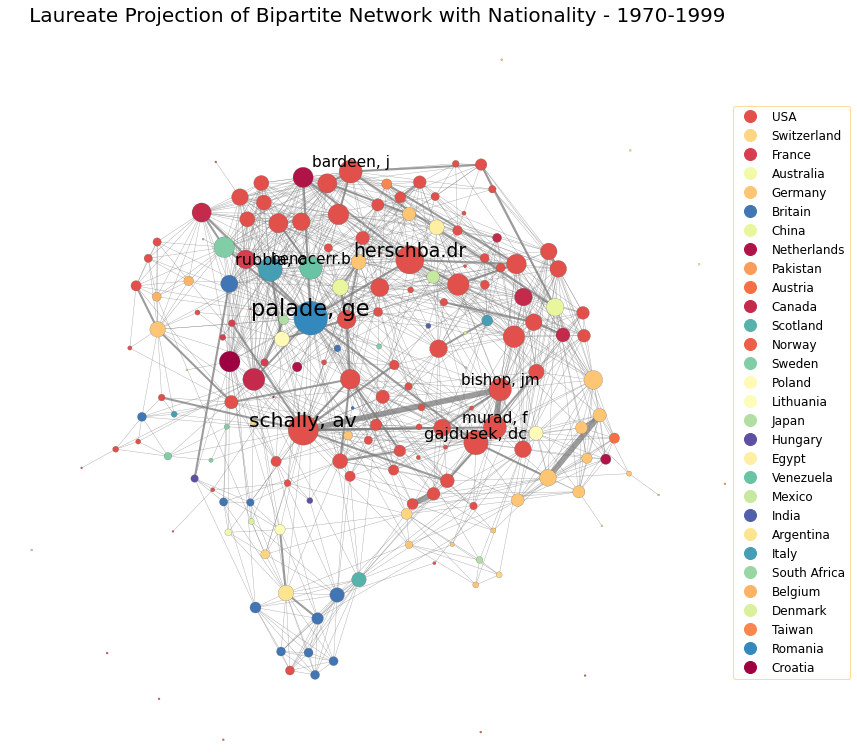

In [99]:
with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, name_nat_dict) # colormap it

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>15: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'   Laureate Projection of Bipartite Network with Nationality - {_period}', size = 20)

# Drawing a big figure
plt.rcParams["figure.figsize"] = (30,30)

val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.9), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')


# Saving as pdf
plt.savefig(f'Plots/{_period}/laureate_projection_nationality.png', dpi=300, bbox_inches='tight')

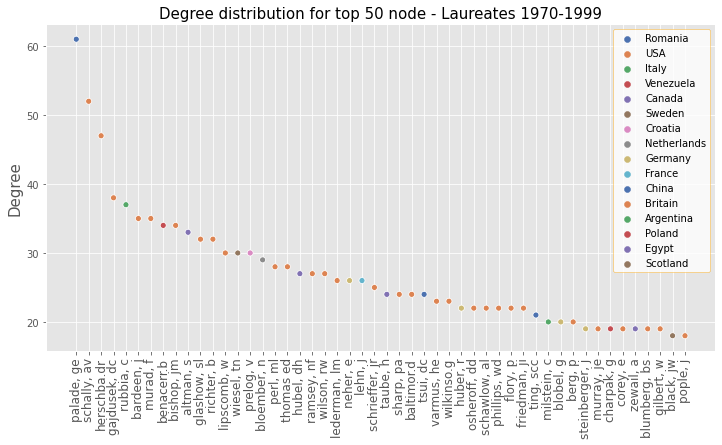

In [100]:
''' Top Laureate nodes with nationality as Hue '''
f = plot_top_nodes(G=G_top_pro,
               hue_name = '',
               hue_dict = name_nat_dict,
               w = True,
               title = f"Laureates {_period}")

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected_laureate_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [101]:
''' Continent hue for organization ''' 
nat_dict = {name:(nat if pd.isna(nat)==False else 'USA') \
            for name, nat in zip(_df.affiliation, _df.uni_nationality)}

# Assign communty labels
nx.set_node_attributes(G_bottom_pro, nat_dict, 'group')

In [63]:
''' Run if configs needs changing'''
#Use netwulf to visualize
# network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False)

' Run if configs needs changing'

In [103]:
''' Save if necesarry '''
with open(f'nx_configs/org_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
    json.dump(config, f)

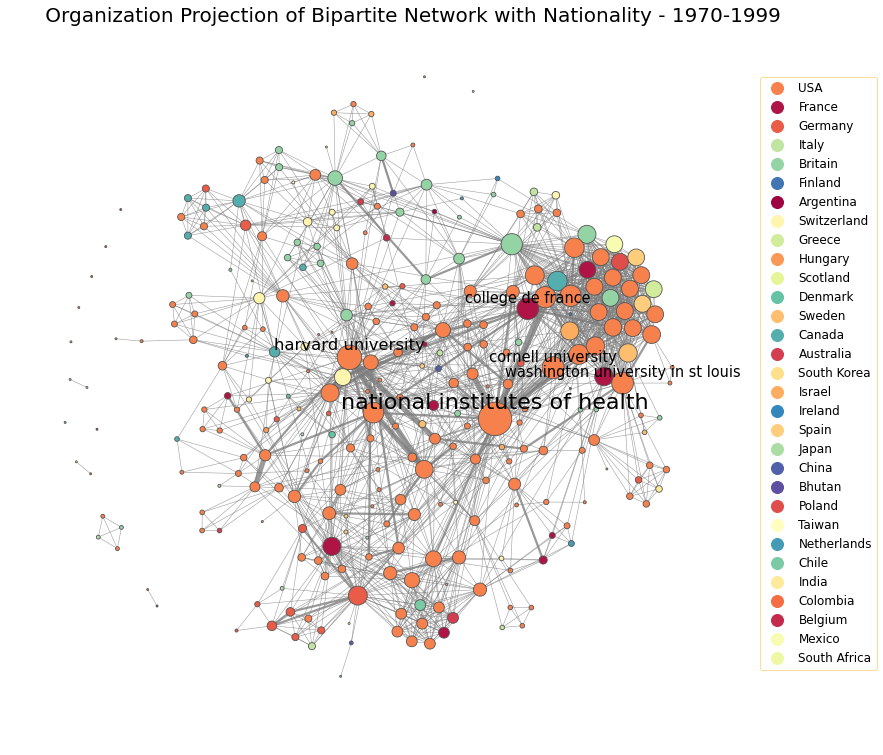

In [107]:
with open(f'nx_configs/org_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, nat_dict) # colormap it

fig, ax = nw.draw_netwulf(network, figsize = 10)


# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>14.5: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = network['nodes'][node_nr]['radius'],
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'      Organization Projection of Bipartite Network with Nationality - {_period}', size = 20)


val_map = {nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)

# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.94), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
fig.tight_layout()
plt.savefig(f'Plots/{_period}/university_projection_continent.png', dpi=300, bbox_inches='tight')

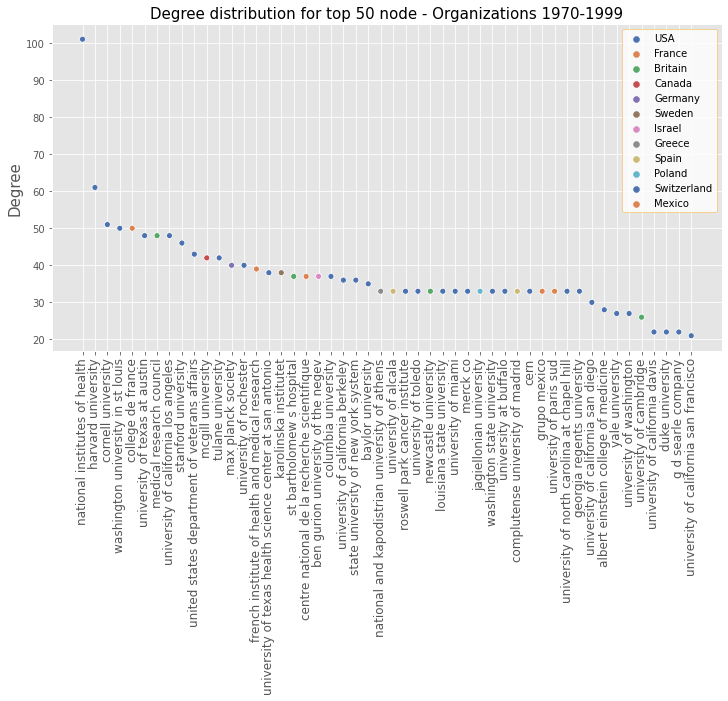

In [108]:
''' Top organization nodes with nationality as Hue '''
f = plot_top_nodes(G=G_bottom_pro,
               hue_name = '',
               hue_dict = nat_dict, w = True,
               title = f"Organizations {_period}")
# Place legend
legend = plt.legend(frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')
# Saving as pdf
f.savefig(f'Plots/{_period}/top_connected_university_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

# 2000-

In [109]:
_df = fourth_period
_period = "after 2000"
_con_per = "2000"

In [110]:
import networkx as nx
from networkx.algorithms import bipartite
import netwulf as nw
plt.style.use('ggplot')

''' Create network '''
G_bi = nx.Graph()
G_bi.add_nodes_from(_df["laureate_name"], bipartite = 0)
G_bi.add_nodes_from(_df["affiliation"], bipartite = 1)
edge_list = list(_df[["laureate_name", "affiliation"]].to_records(index=False))
G_bi.add_edges_from(edge_list)

node_attr = {n:d["bipartite"] for n, d in G_bi.nodes(data=True)}
nx.set_node_attributes(G_bi, node_attr, name = 'group')

''' make weights '''
edge_w_dict = {tuple(key):0 for key in edge_list}
for key in edge_list:
    edge_w_dict[tuple(key)] += 1
    
# We Set weights 
nx.set_edge_attributes(G_bi, edge_w_dict, name = "weight")

In [70]:
''' Run if config needs chaning '''
# network, config = nw.visualize(G_bi, plot_in_cell_below=False) # Run netwulf

' Run if config needs chaning '

In [112]:
''' If new configs should be saved'''
# with open(f'nx_configs/bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

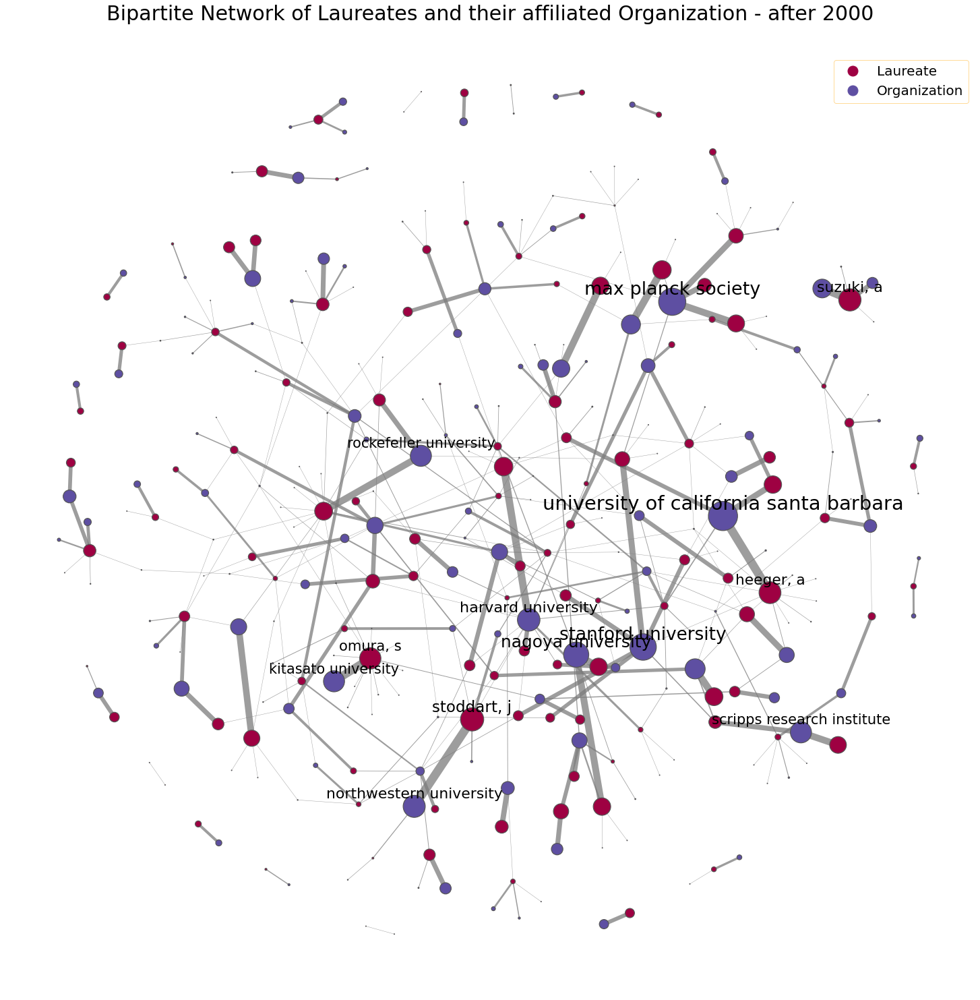

In [115]:
with open(f'nx_configs/bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bi, plot_in_cell_below=False, config = config)

network = redefine_attr(network, node_attr) # colormap it

# Drawing a big figure
plt.rcParams["figure.figsize"] = (20,20)

# Drawing the network
fig, ax = nw.draw_netwulf(network)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>10: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius']*2)
    else:
        pass



''' attribute/hue dicts '''
laureate_dict = dict.fromkeys(_df["laureate_name"], "Laureate")
university_dict = dict.fromkeys(_df["affiliation"], "Organization")
laureate_dict.update(university_dict)


val_map = {laureate_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 15)

# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.97), fontsize = 20)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

ax.set_title(f'Bipartite Network of Laureates and their affiliated Organization - {_period}', size = 30)

# Saving as pdf
plt.savefig(f'Plots/{_period}/bipartite_laureate_uni.', dpi=300, facecolor='w', edgecolor='w',
            bbox_inches="tight")

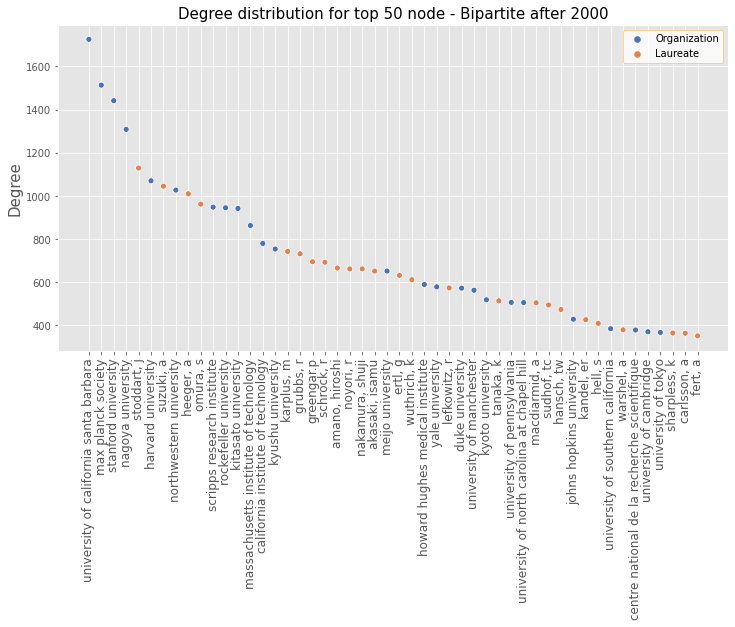

In [116]:
''' top nodes in bipartite network'''
f = plot_top_nodes(G=G_bi,
           hue_name = '',
           hue_dict = laureate_dict,
           w = True,
           title = f'Bipartite {_period}')

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected.', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [117]:
#### Split into projections ####
top_nodes = {n for n, d in G_bi.nodes(data=True) if d["bipartite"] == 0} # Laureates 
bottom_nodes = set(G_bi) - top_nodes

## Projections 
G_top_pro = bipartite.projection.weighted_projected_graph(G_bi, top_nodes)
G_bottom_pro = bipartite.projection.weighted_projected_graph(G_bi, bottom_nodes)

''' Nationality hue for laureates '''
_df.nationality = _df.nationality.apply(lambda x: x.split(',')[0])
name_nat_dict = {name:nat for name, nat in zip(_df.laureate_name, _df.nationality)}

# Assign communty labels
nx.set_node_attributes(G_top_pro, name_nat_dict, 'group')

In [75]:
''' Run if configs needs changing '''
# #Use netwulf to visualize
# network, config = nw.visualize(G_top_pro, plot_in_cell_below=False)

' Run if configs needs changing '

In [119]:
''' Save if necesarry '''
with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
    json.dump(config, f)

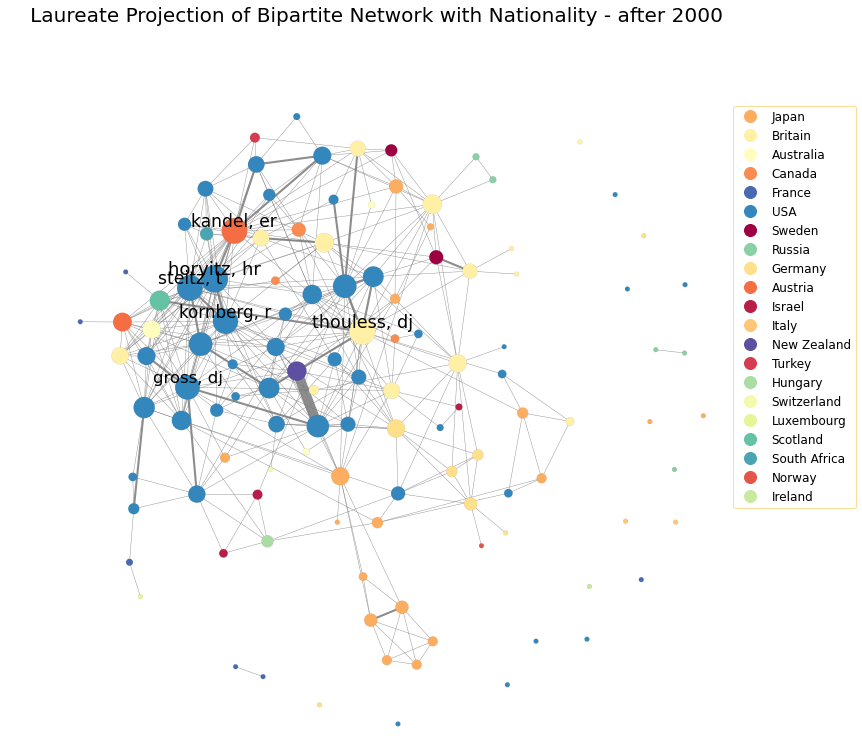

In [124]:
with open(f'nx_configs/lau_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_top_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, name_nat_dict) # colormap it

fig, ax = nw.draw_netwulf(network, figsize = 10)

# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>16: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = 12,
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'   Laureate Projection of Bipartite Network with Nationality - {_period}', size = 20)


val_map = {name_nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)
# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.9), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')


# Saving as pdf
plt.savefig(f'Plots/{_period}/laureate_projection_nationality.png', dpi=300, bbox_inches='tight')

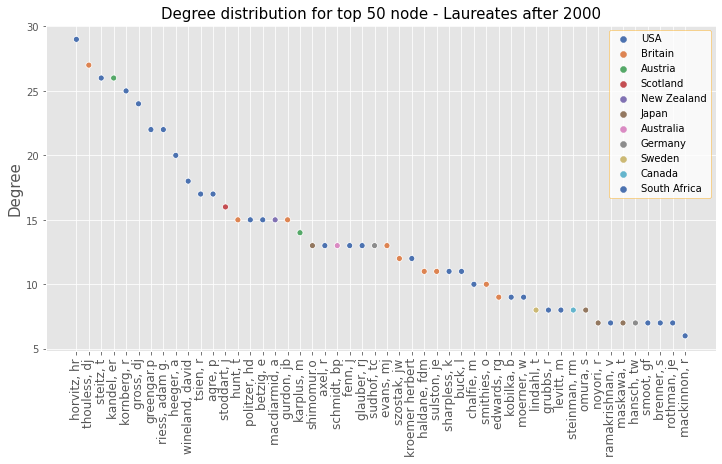

In [125]:
''' Top Laureate nodes with nationality as Hue '''
f = plot_top_nodes(G=G_top_pro,
               hue_name = '',
               hue_dict = name_nat_dict,
               w = True, 
               title = f"Laureates {_period}")

legend = plt.legend(frameon = 1)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

f.savefig(f'Plots/{_period}/top_connected_laureate_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")

In [126]:
''' Continent hue for organization ''' 
nat_dict = {name:(nat if pd.isna(nat)==False else 'USA') \
            for name, nat in zip(_df.affiliation, _df.uni_nationality)}

# Assign communty labels
nx.set_node_attributes(G_bottom_pro, nat_dict, 'group')

In [110]:
''' Run if configs needs changing'''
#Use netwulf to visualize
# network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False)

' Run if configs needs changing'

In [128]:
''' Save if necesarry '''
# with open(f'nx_configs/org_bipartite_{_con_per}.json', 'w', encoding = "utf-8") as f:
#     json.dump(config, f)

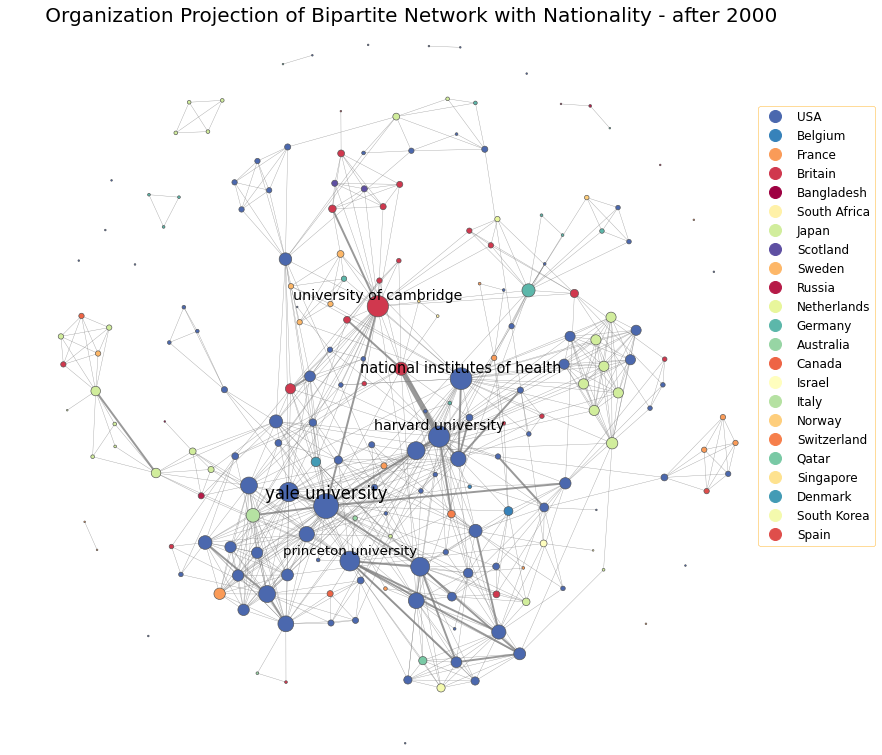

In [131]:
with open(f'nx_configs/org_bipartite_{_con_per}.json', 'r', encoding = "utf-8") as f:
    config = json.load(f)
    
network, config = nw.visualize(G_bottom_pro, plot_in_cell_below=False, config = config)

network = redefine_attr(network, nat_dict) # colormap it

fig, ax = nw.draw_netwulf(network, figsize = 10)


# assigning labels only to the largest nodes 
for node_nr in range(len(network['nodes'])):
    if network['nodes'][node_nr]['radius']>13: # add label if it is of a particular size 
        nw.tools.add_node_label(ax,
                                network,
                                dy = network['nodes'][node_nr]['radius'],
                                node_id = network['nodes'][node_nr]['id'],
                                size=network['nodes'][node_nr]['radius'])
    else:
        pass


    
ax.set_title(f'      Organization Projection of Bipartite Network with Nationality - {_period}', size = 20)


val_map = {nat_dict[node['id']]:node['color'] for node in network['nodes']}

# Add legends
for label in val_map.keys():
    ax.plot([],[],color=val_map[label], label=label, marker='o', linestyle="None", markersize = 12)

# Place legend
legend = plt.legend(bbox_to_anchor = (1,0.9), fontsize = 12)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')

# Saving as pdf
fig.tight_layout()
plt.savefig(f'Plots/{_period}/university_projection_continent.png', dpi=300, bbox_inches='tight')

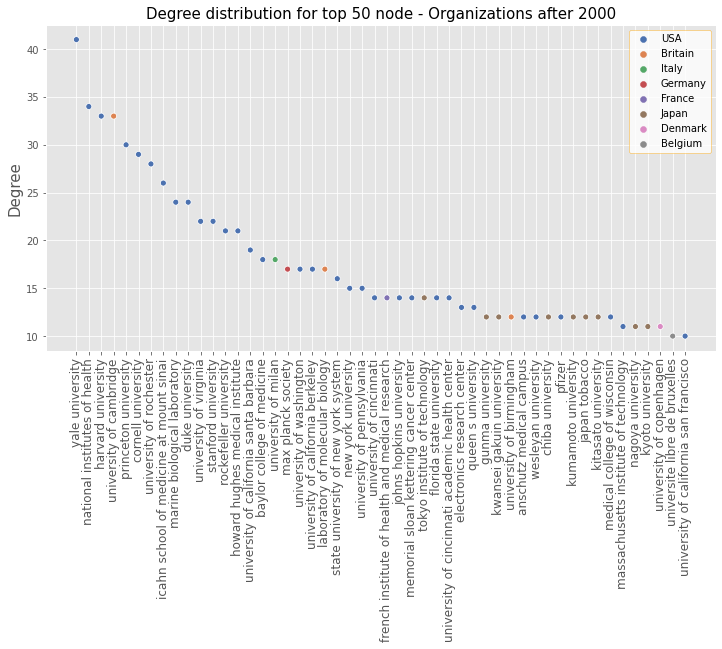

In [132]:
''' Top organization nodes with nationality as Hue '''
f = plot_top_nodes(G=G_bottom_pro,
               hue_name = '',
               hue_dict = nat_dict,
               w = True,
               title = f"Organizations {_period}")
# Place legend
legend = plt.legend(frameon=True)
frame = legend.get_frame()
frame.set_facecolor('white')
frame.set_edgecolor('orange')
# Saving as pdf
f.savefig(f'Plots/{_period}/top_connected_university_bipart.png', dpi=300, facecolor='w', edgecolor='w',
         bbox_inches="tight")